# 3rd lecture on python

In this lecture we'll focus on 2D and 3D animations. 
Here's the list of the topics you'll find in this notebook:

* Review of the construction on an hyperboloid as a ruled surface 
* 2D animations
* 3D animations 

## References

* [2D animations](http://louistiao.me/posts/notebooks/embedding-matplotlib-animations-in-jupyter-as-interactive-javascript-widgets/)
* [3D animations](https://pythonmatplotlibtips.blogspot.com/2018/11/animation-3d-surface-plot-funcanimation-matplotlib.html)

## Hyperboloid as a ruled surface

In order to draw the hyperboloid as a ruled surface, keep in mind the following image:

![HypRuled](./HyperboloidRuled.png)

Our steps are then:

* generate $n$ points along 2 circumferences, with some phase difference between the corresponding points
* draw a straight line connecting the couples of points of the circumference


In [1]:
# usual importing of sympy and its submodules
import sympy 
from sympy import *
from sympy.plotting import *

In [2]:
print("We define here a function which draws a circumference on the xy plane at height z")
import numpy as np # numpy library
def circ_points(n, phi, h):
    points = [] # list of points
    z = h
    for i in range(0,n):
        theta = phi + i*(2*np.pi/n) 
        x = cos(theta)
        y = sin(theta)
        points.append([x,y,z])
    return points
   
print("Check of the function:")
Pi = circ_points(10, 0.0, 0.0)
print(Pi)

We define here a function which draws a circumference on the xy plane at height z
Check of the function:
[[1, 0, 0.0], [0.809016994374947, 0.587785252292473, 0.0], [0.309016994374947, 0.951056516295154, 0.0], [-0.309016994374947, 0.951056516295154, 0.0], [-0.809016994374947, 0.587785252292473, 0.0], [-1.00000000000000, 1.22464679914735e-16, 0.0], [-0.809016994374948, -0.587785252292473, 0.0], [-0.309016994374948, -0.951056516295154, 0.0], [0.309016994374947, -0.951056516295154, 0.0], [0.809016994374947, -0.587785252292473, 0.0]]


Here we define a function that plot a line passing for A and B
testing


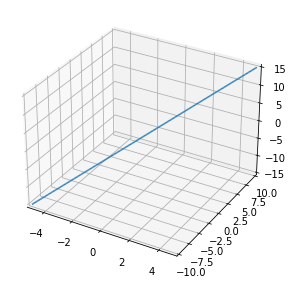

In [3]:
print("Here we define a function that plot a line passing for A and B")
import numpy as np
def get_plot_line(A0,B0, I=[-5,5]):
    A = np.array(A0)
    B = np.array(B0)
    v = (A - B)
    t = symbols("t")
    rt = A + v*t
    return plot3d_parametric_line(rt[0], rt[1], rt[2], (t, I[0], I[1]), show=False)


print("testing")
p1 = get_plot_line([0,0,0],[1,2,3]) # saving the plot object
p1.show() # showing the plot

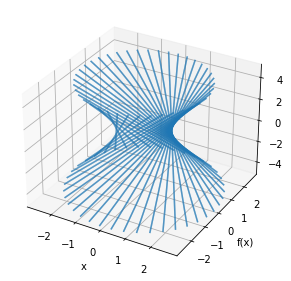

In [4]:
N = 40 # number of straight lines generating our curve
phi = 0.5 # phase difference for the points of the 2 circumferences
h = 1 # height of the 2nd circumference
c1 = circ_points(N,0.0,0.0) # N points on a circumference on the xy plane
c2 = circ_points(N,phi,h) # same as c1, but at height 'h' and out of phase by 'phi'

P_hyp = sympy.plotting.plot(show=False) # creating an empty plot in 3d
for i in range(0,N):
    P_hyp.extend(get_plot_line(c1[i], c2[i])) # adding the line connecting the i-th couple of points
# for cycle has ended
P_hyp.show() # showing the plot

In [5]:
print("Defining a function for generic hyperboloid as ruled surface")
def hyp_ruled(N, phi, h):
    c1 = circ_points(N,0.0,0.0)
    c2 = circ_points(N,phi,h)
    P_hyp = sympy.plotting.plot(show=False)
    for i in range(0,N):
        P_hyp.extend(get_plot_line(c1[i], c2[i]))
    P_hyp.show()

Defining a function for generic hyperboloid as ruled surface


Testing:


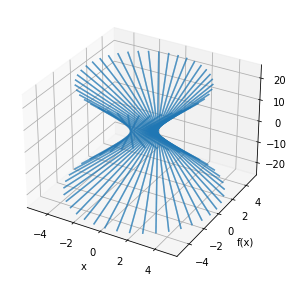

In [6]:
print("Testing:")
hyp_ruled(40, 1.0, 5)

## 2D Animations

We can build animations for an improved visualization. Let's now consider the above function. we can animate it such that it seems to be drawn by hand:

### Example 1

In [7]:
# %matplotlib inline
import numpy as np # numpy (arrays of numbers)
import matplotlib
import matplotlib.pyplot as plt # plotting with matplotlib

from matplotlib import animation, rc  # animations with matplotlib
from IPython.display import HTML # HTML and javascript support

ax.plot() returns a reference to the list of 2D lines
We have initialized our line object, saying that it's a 2D line


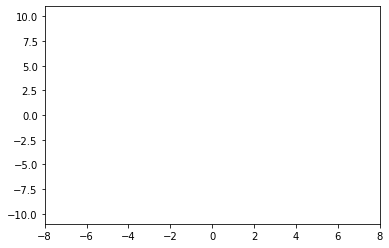

In [8]:
fig, ax = plt.subplots() # assigning the figure and axes to 2 variables

ax.set_xlim(-8, 8) # limits on the x-axis
ax.set_ylim(-11, 11) # limits on the y-axis

# initializing the variable line with an empty plot:
# it will be updated in the following lines of code
print("ax.plot() returns a reference to the list of 2D lines")
line_0 = ax.plot([], [], linewidth=2)[0]
print("We have initialized our line object, saying that it's a 2D line")

In [9]:
print("Here we define the initialization function:")
def init():
    line_0.set_data([], []) # initialize 'line' so that it doesn't contain any points
    return [line_0] # animations need an iterable list of 2D lines. Here we use only one --> list of 1 element only

Here we define the initialization function:


In [10]:
print("Here we define the animation function, which depend on the evolution parameter 'i'")
def animate(i):
    x0 = -8
    m = i/100
    x = np.linspace(x0, x0 + i/10, 100)# 100 points between x0 and x0+i/100
    y = x + 5*np.sin(x - np.pi/2)
    line_0.set_data(x, y)
    return [line_0]

Here we define the animation function, which depend on the evolution parameter 'i'


In [11]:
frn = 180 # number of frames i=0,...,179 
itv = 20 # number of milliseconds between one frame and the other
anim = animation.FuncAnimation(fig, animate, init_func=init, frames=frn, interval=20, blit=True)

In [12]:
jsanim = HTML(anim.to_jshtml())
display(jsanim)

### Example 1 (automatic)

One of the great advantages of programming lies in the possibility to automate a process, avoiding repetitions and errors.
Here we write a function that builds our animation, so that we'll need to specify only a few parameters in the future and call it.

In [13]:
import numpy as np # numpy (arrays of numbers)
import matplotlib
import matplotlib.pyplot as plt # plotting with matplotlib

from matplotlib import animation, rc  # animations with matplotlib
from IPython.display import HTML # HTML and javascript support

In [14]:
def get_jsanim(fig, ax, Ix, Iy, anim_i, frn, itv):
    """
    Ix = x interval
    Iy = y interval
    anim_i = function dependent on i that returns the couple of points [x, y]
    frn = number of frames
    itv = number of milliseconds between one frame and the other
    """
    plt.close("all") # closing any previous figure
    ax.set_xlim(Ix[0], Ix[1]) # limits on the x-axis
    ax.set_ylim(Iy[0], Iy[1]) # limits on the y-axis
    num = 1 # ratio between x and y scale
    ax.set_aspect(num) # e.g. a circle will be stretched such that the height is 'num' times the width.

    # initializing the variable line with an empty plot:
    # it will be updated in the following lines of code
    line = ax.plot([], [], linewidth=2)[0]

    print("Defining the initialization function.")
    def init():
        line.set_data([], []) # initialize 'line' so that it doesn't contain any points
        return [line] # animations need an iterable list of 2D lines. Here we use only one --> list of 1 element only

    print("Defining the animation function")
    def animate(i):
        xy = anim_i(i)
        line.set_data(xy[0], xy[1])
#         line.set_color(clr)
        return [line]
    
    print("The animation will take", frn*itv/1000, "seconds")
    anim = animation.FuncAnimation(fig, animate, init_func=init, frames=frn, interval=itv, blit=True)
    return HTML(anim.to_jshtml())

In [15]:
def anm1(i):
    x0 = -8
    m = i/100
    x = np.linspace(x0, x0 + i/10, 100)# 100 points between x0 and x0+i/100
    y = x + 5*np.sin(x - np.pi/2)
    return [x, y]    

In [16]:
plt.close()
fig, ax = plt.subplots() # assigning the figure and axes to 2 variables
js1 = get_jsanim(fig, ax, [-11,11], [-11,11], anm1, 180, 20)
display(js1)

Defining the initialization function.
Defining the animation function
The animation will take 3.6 seconds


## Example 2

We draw a circumference of radius $1$


In [19]:
N = 200
def anm2(i):
    theta = np.linspace(0.0, (2*np.pi/N)*i, 100)
    xi = np.cos(theta)
    yi = np.sin(theta)
    return [xi, yi]    

In [20]:
plt.close()
fig, ax = plt.subplots() # assigning the figure and axes to 2 variables
js2 = get_jsanim(fig, ax, [-2,2], [-2,2], anm2, N, 10)
display(js2)

Defining the initialization function.
Defining the animation function
The animation will take 2.0 seconds


## 3D animations

In [19]:
print("Again, we can animate our plot:")
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D 
import matplotlib.animation as animation
import matplotlib

Again, we can animate our plot:


In [20]:
N = 150 # size of our lattice of points in the xy-plane
fps = 10 # frames per second
frn = 50 # number of frames from the animation

x = np.linspace(-4,4,N) # N points between -4 and 4
x, y = np.meshgrid(x, x) # lattice of points in [-4,4]x[-4,4]
zarray = np.zeros((N, N, frn)) # NxNxfrn numbers

f = lambda x,y,sig : sig*np.exp(-(x**2+y**2)) # our function

for i in range(frn): # generating 'frn' plots (one for each frame)
    sig_i = np.sin(i*2*np.pi/frn) # sigma oscillating in time (with 'i')
    zarray[:,:,i] = f(x,y,sig_i) # global extra oscillation with time

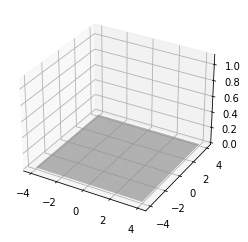

In [21]:
def update_plot(frame_number, zarray, plot):
    plot[0].remove() # removing the old plot
    # the plot is now set equal to the 'frame_number' one
    plot[0] = ax.plot_surface(x, y, zarray[:,:,frame_number], cmap="turbo") 
    

fig = plt.figure() # creating a figure
ax = fig.add_subplot(111, projection='3d') # creating an "axes" object (it's out plot)

plot = [ax.plot_surface(x, y, zarray[:,:,0], color='0.75', rstride=1, cstride=1)] # first plot (0-th plot)
ax.set_zlim(0,1.1) # setting the limits on the 'z' axis
anim_3D = animation.FuncAnimation(fig, update_plot, frn, fargs=(zarray, plot), interval=1000/fps)

In [22]:
jsanim = HTML(anim_3D.to_jshtml()) # creating our animation
display(jsanim) # displaying our animation